# TP séance 7 - Arbres et plus courts chemins
L'objectif de ce TP est d'implémenter les algorithmes de Kruskal, Prim et Dijkstra vus en cours.
L'algorithme de Dijkstra sera utilisé pour un problème concret : calculer le meilleur itinéraire entre deux points d'une ville, et l'afficher sur une carte.

## Exercice 1 : algorithme de Kruskal


### Q.1
Utilisez les fonctions de NetworkX pour générer des graphes aléatoires *pondérés*, et afficher les poids des arêtes sur le graphe ; vous pourrez utiliser un graphe de type $G_{n,m}$, avec environ 1,5 fois plus d'arêtes que de sommets.

{(0, 8): Text(0.2290538784382894, 0.36397084470207863, '9'),
 (0, 7): Text(0.3509941542608044, 0.18130903854524724, '13'),
 (0, 6): Text(0.19945039113306878, 0.22986891980600363, '5'),
 (1, 6): Text(0.39856227639838965, -0.21258866062132387, '2'),
 (1, 2): Text(0.7872532546929307, -0.3746082194537293, '9'),
 (2, 7): Text(0.5428838933423146, -0.10591581339030673, '9'),
 (3, 9): Text(-0.8577864961645809, -0.0886688225811256, '2'),
 (3, 6): Text(-0.49867542403998105, 0.12893996307036432, '2'),
 (4, 5): Text(-0.31271355201441287, 0.04320245189067744, '13'),
 (4, 6): Text(-0.14689449339910707, 0.16983703867936237, '6'),
 (4, 8): Text(-0.11729100609388647, 0.30393896357543737, '12'),
 (5, 7): Text(-0.011626143567532332, -0.07053084134658623, '8'),
 (5, 9): Text(-0.5222809788198679, -0.23957974573731974, '14'),
 (6, 8): Text(0.032252639225258485, 0.2387655515989301, '13'),
 (7, 8): Text(0.1837964023529941, 0.1902056703381737, '8')}

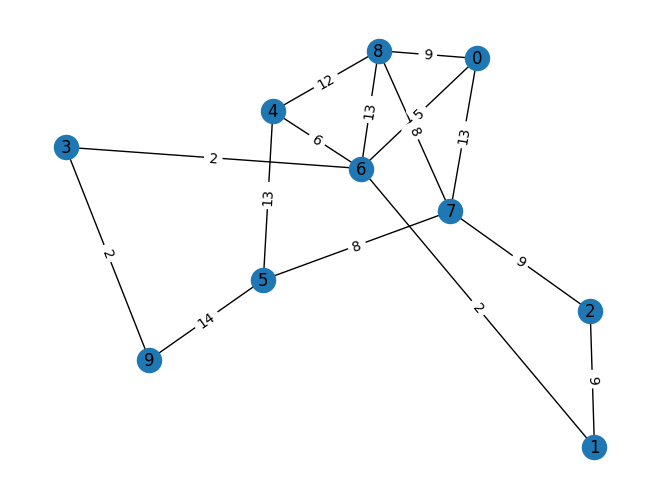

In [28]:
# Création d'un graph avec poids aléatoire

# Bibliothèque
import networkx as nx
import random

# Graph
G = nx.gnm_random_graph(10, 15)

# Atribution des poids
for (u, v) in G.edges :
  G.edges[u,v]["weight"] =  random.randint(1,15)

# Affichage du graph
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
label = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, label)

### Q.2 
Implémentez l'algorithme de Kruskal et testez-le sur un graphe pondéré aléatoire, d'abord en affichant la *liste* des arêtes de l'arbre couvrant de poids minimum, puis en mettant en évidence ces arêtes sur le graphe. Comment détecter / empêcher la formation d'un cycle ?

{(1, 6): Text(0.2814063069241972, 0.3658982064887331, '2'),
 (1, 2): Text(0.5293203201516913, 0.6880668415337362, '9'),
 (6, 3): Text(0.3255031174782459, -0.029993834349838683, '2'),
 (6, 0): Text(-0.0810319877587238, 0.030114546813652693, '5'),
 (6, 4): Text(0.05376420729156026, 0.2542822437109973, '6'),
 (3, 9): Text(0.7184359246423879, -0.3263838676758775, '2'),
 (0, 8): Text(-0.40467327330448344, -0.15443714406453593, '9'),
 (5, 7): Text(-0.8968471787811562, -0.46152807350431924, '8'),
 (7, 8): Text(-0.6677467276295714, -0.31347635355686165, '8')}

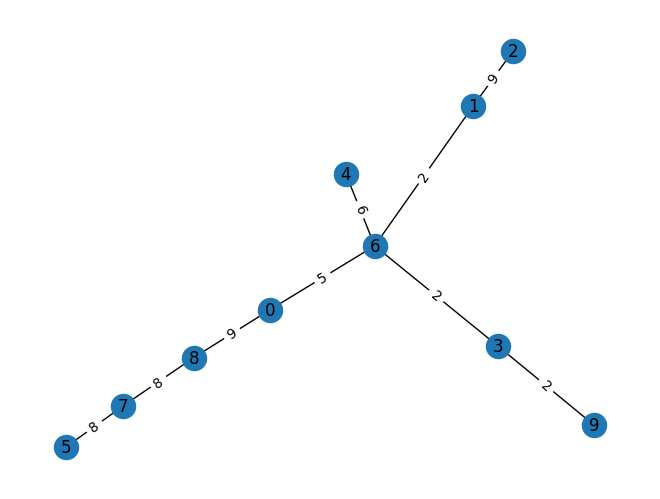

In [29]:
# Implémentation de l'algorithme de Kruskal

# Classe des Set de node
class Set:
  
    parent = {}
    def makeSet(self, n):
        for i in range(n):
            self.parent[i] = i

    # Cherche si la node est deja dans l'arbre
    def find(self, k):
        if self.parent[k] == k:
            return k
        return self.find(self.parent[k])

    # Relie deux node pour eviter de les relier
    def union(self, a, b):
        x = self.find(a)
        y = self.find(b)
 
        self.parent[x] = y
 
# Fonction de Kruskal
def Kruskal(G):
    K = []
    s = Set()
    index = 0

    s.makeSet(len(G))
    
    while index != len(G) - 1:
      src = G[index][1][0]
      dest = G[index][1][1]
      weight = G[index][0]
      index = index + 1
      u = s.find(src)
      v = s.find(dest)

      if u != v:
          K.append((src, dest, weight))
          s.union(u, v)

    return K

# Tri par ordre croissant
G1=[]
for (u, v) in G.edges :
    G1.append([G.edges[u,v]["weight"], (u,v)])
G1.sort()

K = Kruskal(G1)

edges = []
for e in K:
  edges.append((e[0], e[1]))


# Création de l'arbre de Kruskal
G1 = nx.Graph(edges)
for (u, v) in G1.edges :
  G1.edges[u,v]["weight"] =  G.edges[u,v]["weight"]
  
# Affichage de l'arbre
pos = nx.spring_layout(G1)
nx.draw(G1, pos, with_labels=True)
label = nx.get_edge_attributes(G1, 'weight')
nx.draw_networkx_edge_labels(G1, pos, label)

{(0, 5): Text(-0.19569603803904081, -0.5999561251749255, '5'),
 (1, 8): Text(0.3142990045448937, 0.8538915914041142, '1'),
 (1, 9): Text(0.18905211968788438, 0.6316697954704387, '7'),
 (2, 5): Text(-0.25298102909883763, -0.5125543834675839, '6'),
 (3, 6): Text(0.035041732561188185, 0.24462674932079465, '2'),
 (3, 9): Text(0.11398756146127922, 0.4775989468599566, '9'),
 (4, 5): Text(-0.0801492092711486, -0.5970397941558596, '3'),
 (5, 7): Text(-0.1423162676235183, -0.4311576663390338, '12'),
 (6, 7): Text(-0.06465442680389902, -0.13154785169648153, '1')}

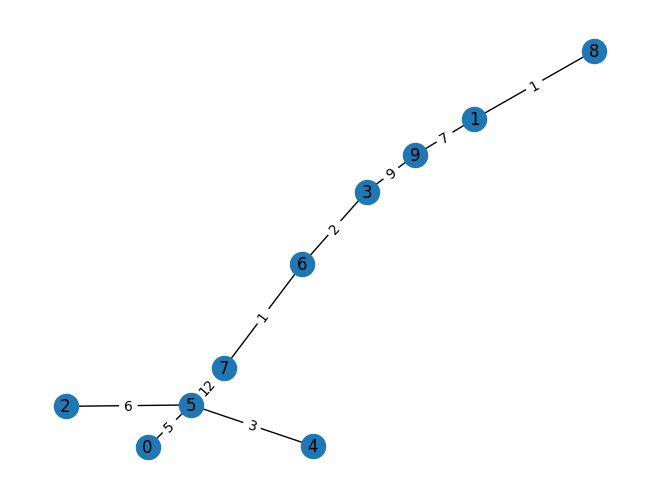

In [14]:
# Comparaison avec la fonction de NetworkX
H = nx.minimum_spanning_tree(G, weight='weight', algorithm='kruskal', ignore_nan=False)

pos = nx.spring_layout(H)
nx.draw(H, pos, with_labels=True)
label = nx.get_edge_attributes(H, 'weight')
nx.draw_networkx_edge_labels(H, pos, label)

## Exercice 2 : algorithme de Prim
Implémentez l'algorithme de Prim ; pensez à le tester également !

{(0, 4): Text(-0.6256973606342613, -0.6967768476409713, '4'),
 (1, 8): Text(-0.1363453536506091, 0.033508853554678406, '11'),
 (1, 5): Text(0.0835492020620238, 0.16277119667470097, '7'),
 (1, 9): Text(-0.13036112233709538, 0.2015652335015703, '6'),
 (2, 5): Text(0.6085301046094023, 0.4268822702759031, '1'),
 (2, 3): Text(0.8438418321810413, 0.5986634235917501, '5'),
 (3, 5): Text(0.4523719367904435, 0.35910682769330066, '4'),
 (4, 8): Text(-0.3572413072783282, -0.2611705501114135, '10'),
 (4, 6): Text(-0.580212908673726, -0.371492792392076, '13'),
 (5, 8): Text(-0.0028343464938283686, 0.05806333125743106, '10'),
 (5, 9): Text(0.003149884819685367, 0.22611971120432295, '3'),
 (5, 7): Text(0.35791715439217325, 0.07806944469090503, '6'),
 (6, 8): Text(-0.44570050360185903, -0.18152125414325404, '4'),
 (7, 9): Text(0.1440068299930541, 0.11686348151777436, '1'),
 (8, 9): Text(-0.21674467089294752, 0.09685736808430039, '9')}

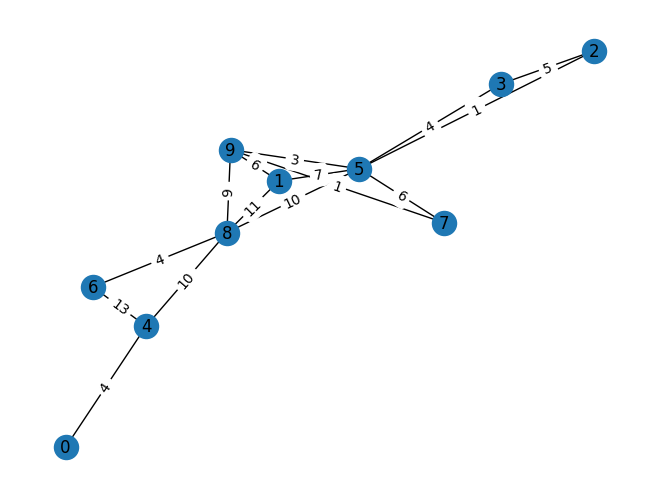

In [42]:
# Création d'un graph avec poids aléatoire

# Bibliothèque
import networkx as nx
import random

# Graph
G = nx.gnm_random_graph(10, 15)

# Atribution des poids
for (u, v) in G.edges :
  G.edges[u,v]["weight"] =  random.randint(1,15)

# Affichage du graph
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
label = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, label)

{(4, 0): Text(0.20701107626097973, -0.45279278334720025, '4'),
 (4, 6): Text(-0.4407674116601321, 0.10475819158647218, '13'),
 (4, 8): Text(0.16925509395462957, 0.4424490250663278, '10')}

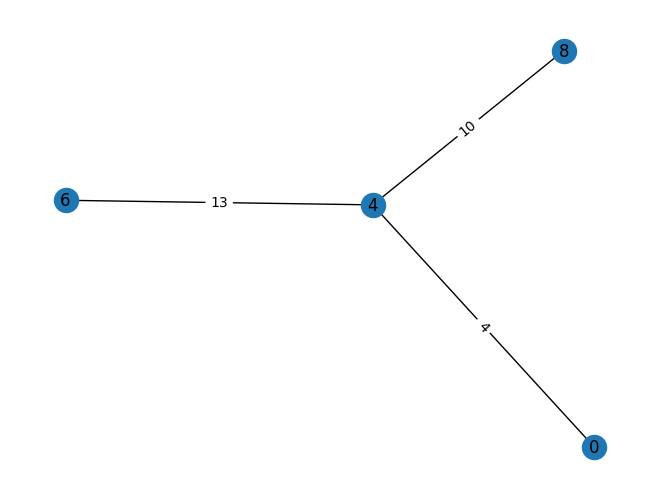

In [44]:
# Fonction de Prim
def Prim(G):

    visites = [0]
    parents = [None] * len(G.nodes())
    poids = {node: float('inf') for node in G.nodes()}
    poids[0] = 0


    while len(visites) != len(G.nodes()):
        poids_min = float('inf')
        for node in visites:
            for voisin in G.neighbors(node):
                if voisin not in visites and poids[voisin] > G[node][voisin]['weight']:
                    poids[voisin] = G[node][voisin]['weight']
                    parents[voisin] = node
                if poids[voisin] < poids_min:
                    poids_min = poids[voisin]
                    prochain = voisin
        visites.append(prochain)

    P = nx.Graph()
    for i in range(len(G.nodes())):
        if parents[i] is not None:
            P.add_edge(i, parents[i])

    return P

G2=Prim(G)

# Affichage du graph
for (u, v) in G2.edges :
  G2.edges[u,v]["weight"] =  G.edges[u,v]["weight"]
pos = nx.spring_layout(G2)
nx.draw(G2, pos, with_labels=True)
label = nx.get_edge_attributes(G2, 'weight')
nx.draw_networkx_edge_labels(G2, pos, label)


## Exercice 3 : Algorithme de Dijkstra
Ecrivez une fonction `dijkstra(G, s, d)` qui prend un graphe pondéré en entrée, et calcule le plus court chemin du sommet source `s` vers le sommet destination `d`. Votre fonction doit retourner **la longueur de l'itinéraire (en m)** ainsi que **la liste des sommets permettant de reconstituer l'itinéraire**. Testez cette fonction sur un graphe aléatoire.

{(0, 2): Text(-0.26535835409312436, 0.5899291358132797, '3'),
 (0, 1): Text(-0.7910408286179571, 0.6664827754445461, '9'),
 (0, 5): Text(-0.36268645258324, 0.24933581128319793, '7'),
 (2, 3): Text(0.12949541195352443, 0.4270123770091902, '10'),
 (3, 5): Text(0.03216731346340876, 0.08641905247910847, '7'),
 (3, 7): Text(0.15680277806147808, -0.035703176659701574, '11'),
 (3, 4): Text(0.46557648580139743, -0.21679907989023628, '2'),
 (4, 6): Text(0.5281310632136051, -0.5938670736847953, '13'),
 (5, 9): Text(0.10848857330799426, -0.11508980629375515, '10'),
 (5, 7): Text(-0.018655783332496574, -0.14024846255382667, '4'),
 (5, 8): Text(-0.0997096844552364, -0.26241604333637625, '10'),
 (6, 8): Text(0.13830345435094593, -0.5349387512368102, '13'),
 (6, 7): Text(0.21935735547368576, -0.4127711704542606, '12'),
 (6, 9): Text(0.3465017121141766, -0.3876125141941891, '12'),
 (7, 8): Text(0.02492578014283291, -0.3845382724751863, '11')}

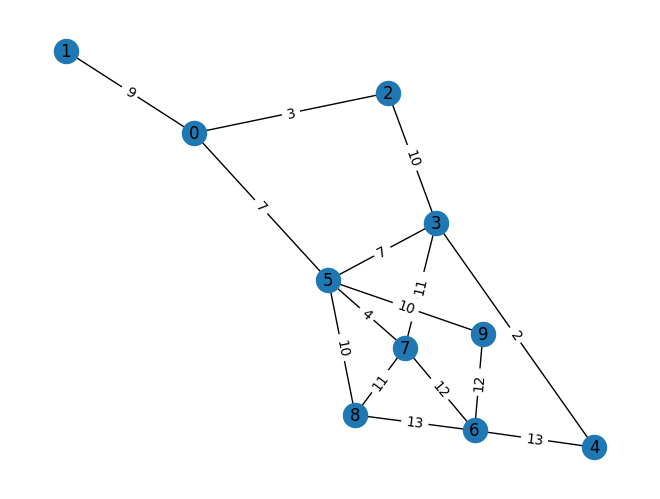

In [36]:
import networkx as nx
import random
G = nx.gnm_random_graph(10, 15)

for (u, v) in G.edges :
  G.edges[u,v]["weight"] =  random.randint(1,15)

pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
label = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, label)

In [37]:
def dijkstra(graph, start, end):

    distances = {node: float('inf') for node in graph}
    distances[start] = 0
    visited = set()
    path=[]
    pre=False
    while end not in visited:
        current_node = min((node for node in graph if node not in visited), key=lambda x: distances[x])
        visited.add(current_node)

        if distances[current_node] == float('inf'):
            break

        for neighbor in range(len(graph.edges)):
          
          try:
            if neighbor != current_node:
              weight = G.edges[current_node,neighbor]["weight"]
              if neighbor not in visited:
                  new_distance = distances[current_node] + weight
                  if new_distance < distances[neighbor]:
                      distances[neighbor] = new_distance
                      if current_node not in path:
                        path.append(current_node)
          except:
            i=0

    return distances[end], path

print(dijkstra(G, 4, 2))
print(nx.dijkstra_path(G, 4, 2))

(12, [4, 3, 5, 2])
[4, 3, 2]


## Exercice 4 : Application au calcul d'itinéraire
[OSMnx](https://geoffboeing.com/2016/11/osmnx-python-street-networks/) est un package Python permettant d'exploiter au format NetworkX les données disponibles sur [OpenStreetMap](https://openstreetmap.org). Il permet notamment de récupérer toutes les informations du réseau routier, piéton, de transports en commun, etc. et de le manipuler avec NetworkX. De nombreux exemples sont disponibles [sur cette page](https://github.com/gboeing/osmnx-examples).

Google Colaboratory permet d'exécuter des notebooks sur lesquels OSMnx et toutes ses dépendances sont installées.

**Note** : Vous pouvez aussi bien sûr travailler en local, mais il vous faudra installer OSMnx et toutes ses dépendances.

On commence par installer la librairie OSMnx :

*Edit 2023 : la version 1.24 de `numpy` pose problème dans Colab ; on force l'installation de la version 1.23*

In [34]:
%pip install numpy==1.23
%pip install osmnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 62.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 73.9 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Uninstalling requests-2.27.1:
      Successfully uninstalled requests-2.27.1


On importe ensuite les paquets nécessaires :

In [20]:
import networkx as nx
import osmnx as ox

%matplotlib inline
ox.config(log_console=True)

/usr/local/lib/python3.10/dist-packages/osmnx/utils.py:192: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  warnings.warn(


*A partir de maintenant, toutes les informations, fonctions... sont à chercher dans les documentations fournies au début de cette section.*

**Affichez le réseau routier de Lyon :**

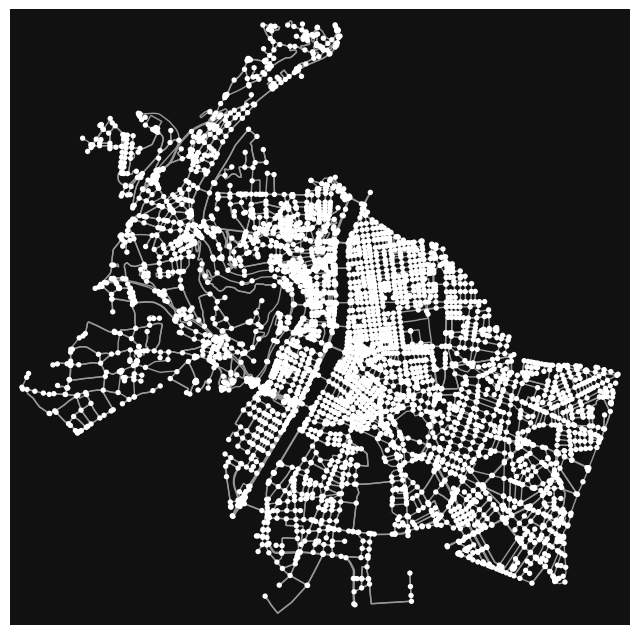

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [21]:
G = ox.graph_from_place('Lyon, France', network_type='drive')
ox.plot_graph(G)

Par défaut, les sommets sont affichés ; quand ils sont trop nombreux, ils nuisent à la lisibilité du graphe. **Affichez de nouveau le réseau routier, en jaune, dans une image de taille 10x10, et sans afficher les sommets.**

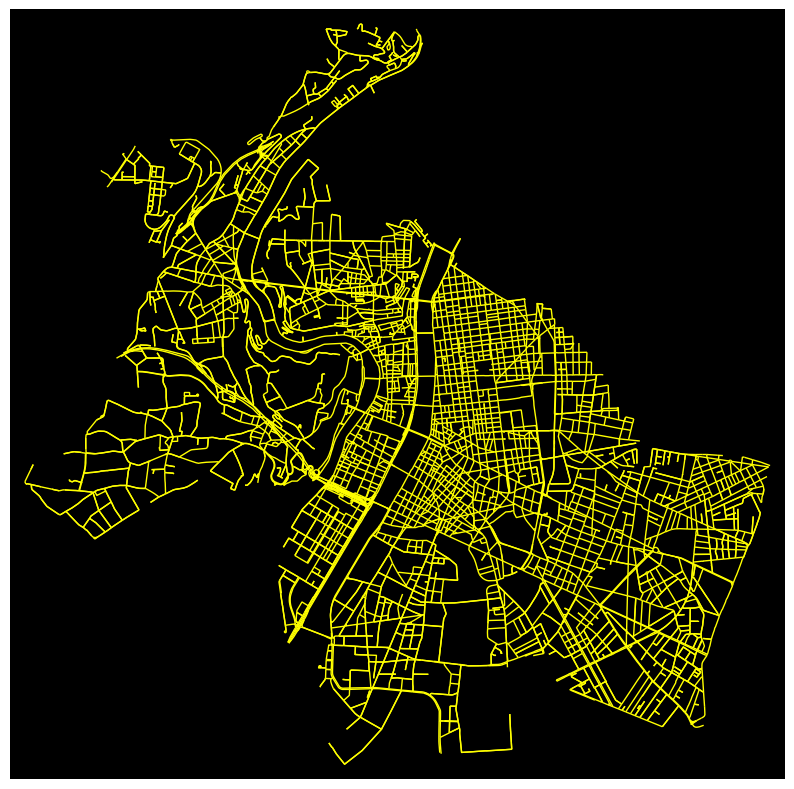

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [22]:
ox.plot_graph(G, bgcolor='black', edge_color='yellow', node_color='none', node_size=0, figsize=(10,10))

**Combien de sommets et d'arêtes ce graphes comporte-t-il ?**



In [23]:
len(G.nodes)

4247

In [24]:
len(G.edges)

8474

**Superposez le réseau routier sur une carte de Lyon** (il existe une fonction d'affichage d'OSMnx pour ça ;)) ; **faites-en sorte que le nom d'une rue soit affiché quand on clique dessus**.

In [25]:
ox.folium.plot_graph_folium(G, popup_attribute='name')

A présent, l'idée est de déterminer le plus court chemin entre les deux points géographiques fournis, à l'aide de l'algorithme de Dijkstra codé ci-dessus, et de l'afficher sur la carte.

Les *numéros* des sommets donnés par OpenStreetMap sont ceux de sa base de données *mondiale* : il peuvent être très grands (de l'ordre du milliard pour certains) et surtout ne pas être consécutifs. **Si besoin, modifiez votre fonction `dijkstra` pour qu'elle puisse gérer des numéros de sommets quelconques.**

La fonction `nearest_nodes` renvoie le sommet / noeud du graphe le plus proche des coordonnées géographiques (longitude, latitude) données en paramètre. Récupérez les coordonnées des deux points géographiques fournis (via Google Maps, ou [OpenStreetMap](https://www.openstreetmap.org) en faisant un clic-droit puis *Affichez l'adresse*) et affichez les numéros des sommets les plus proches.

In [26]:
a=ox.nearest_nodes(G, 45.75850, 4.83207) # Place Bellecour
b=ox.nearest_nodes(G, 45.76727, 4.83356) # Place des Terreaux
print(a)
print(b)

4756679790
4756679790


Appliquez votre fonction `dijkstra` aux deux sommets du graphe, puis superposez en rouge l'itinéraire obtenu :

(0, [])
